In [2]:
%matplotlib inline
import scanpy as sc
import anndata
import os
from scipy import sparse
import numpy as np
import pandas as pd
sc.settings.verbosity = 3
sc.logging.print_version_and_date()

/home/bobby/anaconda3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


Running Scanpy 1.8.2, on 2023-07-13 15:05.


In [3]:
from matplotlib import pyplot as plt
from matplotlib import rcParams
import seaborn as sns

# Data preporcessing

In [38]:
adata = sc.read_h5ad('./write/GSE155259_Roy_et_al.h5ad')

In [39]:
adata

AnnData object with n_obs × n_vars = 57489 × 33538
    obs: 'sampleID', 'UMI_count', 'detectedGenesPerCell', 'percent_mito', 'donor', 'tissue_type', 'cluster_id', 'cell_type'
    var: 'name'
    obsm: 'X_fdg', 'X_tsne', 'X_umap'

In [9]:
adata_f = adata[~adata.obs['cell_type'].isin(['Endothelial cell', 'Eosinophil/Basophil/Mast']),]

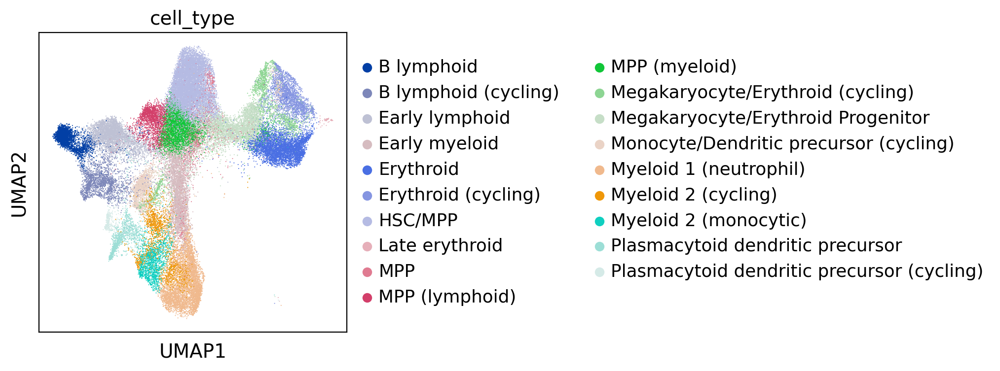

In [10]:
sc.pl.umap(adata_f,color=['cell_type'])

In [8]:
sc.set_figure_params(dpi=100,dpi_save=500)

In [11]:
cell_type_id =['B', 'cycl-B', 'EarlyLymp', 'EarlyMyel',
       'Endo', 'E/B/M', 'Ery',
       'cycl-Ery', 'HSC/MPP', 'Late-Ery', 'MPP',
       'Lymp-MPP', 'Myel-MPP', 'Mega',
       'ProMega',
       'Mono', 'neutro-Myel',
       'cycl-Myel', 'mono-Myel',
       'PreDC',
       'cycl-PreDC']
adata.obs['cell_type_id'] = adata.obs['cell_type']
adata.rename_categories('cell_type_id',cell_type_id)

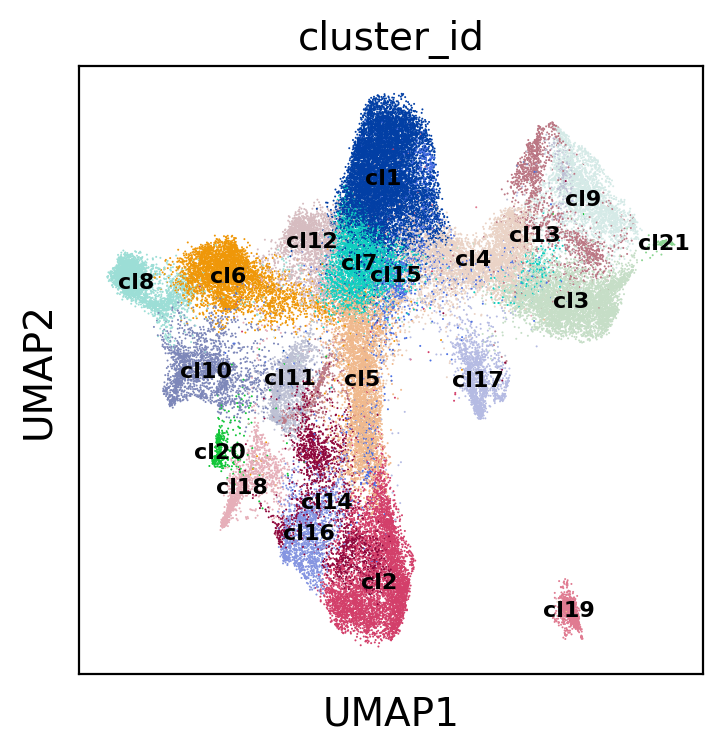

In [7]:
sc.pl.umap(adata,color=['cluster_id'],legend_loc='on data',legend_fontsize=8,
           #save='_adata_cluster_id_20210918.pdf'
          )

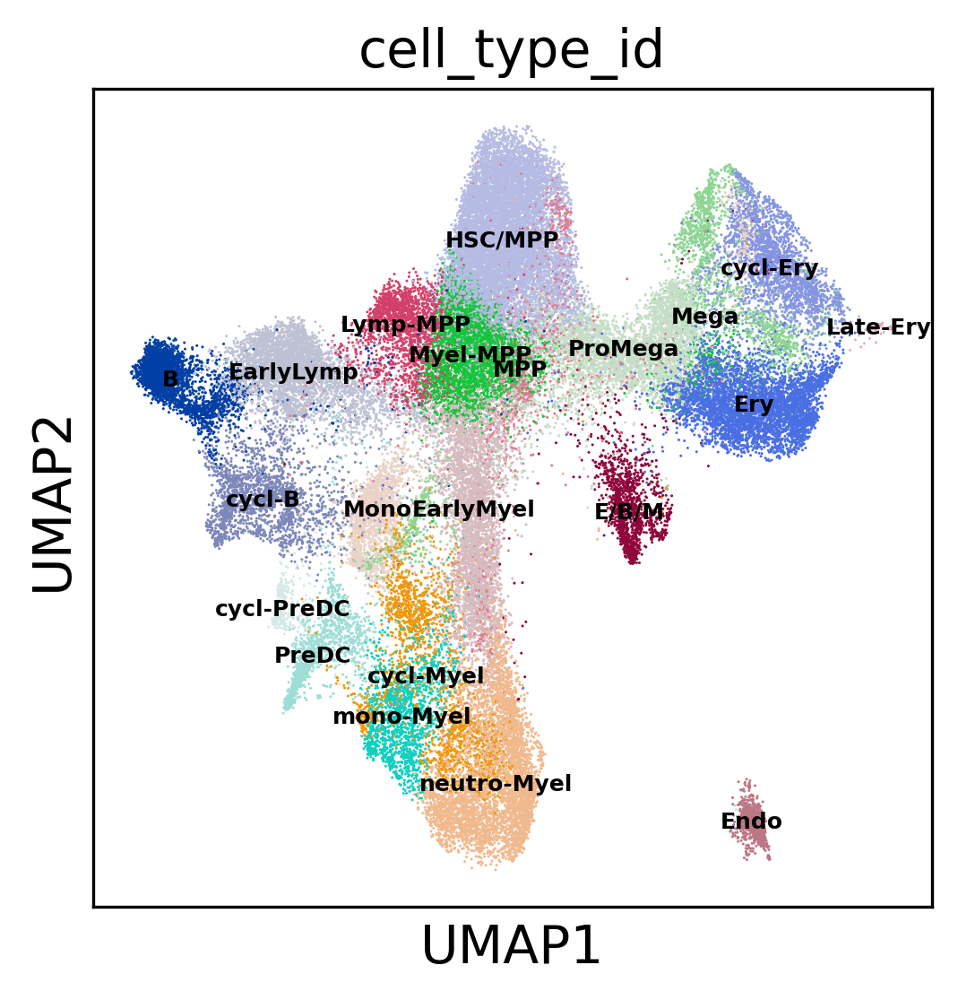

In [41]:
sc.pl.umap(adata,color=['cell_type_id'],legend_loc='on data',legend_fontsize=6,
          save='_adata_cell_type_id_20210918.pdf')

In [241]:
adata.write_h5ad('./write/GSE155259_Roy_et_al_raw_counts_20210918.h5ad')

In [31]:
sc.pp.normalize_per_cell(adata,counts_per_cell_after=1e4)
sc.pp.log1p(adata)

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [ ]:
adata.write_h5ad('./write/GSE155259_Roy_et_al_raw_counts_norm_log1p_20210918.h5ad')

In [64]:
adata = sc.read_h5ad('./write/GSE155259_Roy_et_al_raw_counts_norm_log1p_20210918.h5ad')

In [42]:
adata

AnnData object with n_obs × n_vars = 57489 × 33538
    obs: 'sampleID', 'UMI_count', 'detectedGenesPerCell', 'percent_mito', 'donor', 'tissue_type', 'cluster_id', 'cell_type', 'cell_type_id', 'n_counts', 'dpt_pseudotime'
    var: 'name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'adata_pseu_location_draw_graph', 'adata_pseu_location_umap', 'cell_type_colors', 'cell_type_id_colors', 'cell_type_id_sizes', 'cluster_id_colors', 'diffmap_evals', 'donor_colors', 'draw_graph', 'hvg', 'iroot', 'markers_s_DEAPLOG', 'markers_s_auto', 'markers_s_power11', 'neighbors', 'paga', 'pca', 'run_PLOGS_time', 'sampleID_colors', 'tissue_type_colors'
    obsm: 'X_diffmap', 'X_draw_graph_fa', 'X_fdg', 'X_tsne', 'X_umap'
    obsp: 'connectivities', 'distances'

# Illustration of DEGs identification by DEAPLOG

In [ ]:
import deaplog as dpg

In [43]:
rdata_df = adata.to_df()

In [44]:
for g in ['CD27','PLPP3','HBB','CD3E','FAM129C','HBD','IGHM','RBM47','RBPMS2','VPREB1',
                        'GAPDH','RPL22']:
    g_highly_cells = plogs.get_highly_cells_for_each_gene(rdata_df=rdata_df,gene=g,power=11)
    gene_list = rdata_df[g]
    gene_filter = gene_list.loc[gene_list>0,]
    gene_sort_df_filter = gene_filter.sort_values(ascending=False)
    x1 = plogs.draw_fitted_curve(gene_sort_df_filter,power=11)
    plt.xlabel(xlabel='Index of ranked cells')
    plt.ylabel(ylabel='Expression level of '+g)
    plt.vlines(x=len(g_highly_cells[0][g]),ymin=0,ymax=gene_sort_df_filter.max()-0.5,
               colors='black',linestyles='dashed')
    plt.text(x=len(g_highly_cells[0][g]),y=gene_sort_df_filter.max()-0.5,
             s='x='+str(len(g_highly_cells[0][g])))
    plt.grid(b='')
    plt.savefig('./figures/draw_fitted_curve_adata_'+g+'_D11_20220108.pdf')
    plt.close()
    adata.obs[g+'HighlyCells'] = 'False'

    gHighlyCells_df = pd.DataFrame(adata.obs[g+'HighlyCells'])

    gHighlyCells_df.loc[gHighlyCells_df.index.isin(g_highly_cells[0][g]),[g+'HighlyCells']]='True'

    adata.obs[g+'HighlyCells'] = gHighlyCells_df[g+'HighlyCells']

    cat_dtype = pd.api.types.CategoricalDtype(categories=['True','False'], ordered=True)
    adata.obs[g+'HighlyCells'] = adata.obs[g+'HighlyCells'].astype(cat_dtype)

    adata.uns[g+'HighlyCells_colors']=['#ff3366','#cccccc']

/home/bobby/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  
/home/bobby/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  
/home/bobby/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  
/home/bobby/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor release

In [54]:
for g in ['GATA3','ZNF683','GAS7','PAX5']:
    g_highly_cells = plogs.get_highly_cells_for_each_gene(rdata_df=rdata_df,gene=g,power=11)
    gene_list = rdata_df[g]
    gene_filter = gene_list.loc[gene_list>0,]
    gene_sort_df_filter = gene_filter.sort_values(ascending=False)
    x1 = plogs.draw_fitted_curve(gene_sort_df_filter,power=11)
    plt.xlabel(xlabel='Index of ranked cells')
    plt.ylabel(ylabel='Expression level of '+g)
    plt.vlines(x=len(g_highly_cells[0][g]),ymin=0,ymax=gene_sort_df_filter.max()-0.5,
               colors='black',linestyles='dashed')
    plt.text(x=len(g_highly_cells[0][g]),y=gene_sort_df_filter.max()-0.5,
             s='x='+str(len(g_highly_cells[0][g])))
    plt.grid(b='')
    plt.savefig('./figures/draw_fitted_curve_adata_'+g+'_D11_20220108.pdf')
    plt.close()
    adata.obs[g+'HighlyCells'] = 'False'

    gHighlyCells_df = pd.DataFrame(adata.obs[g+'HighlyCells'])

    gHighlyCells_df.loc[gHighlyCells_df.index.isin(g_highly_cells[0][g]),[g+'HighlyCells']]='True'

    adata.obs[g+'HighlyCells'] = gHighlyCells_df[g+'HighlyCells']

    cat_dtype = pd.api.types.CategoricalDtype(categories=['True','False'], ordered=True)
    adata.obs[g+'HighlyCells'] = adata.obs[g+'HighlyCells'].astype(cat_dtype)

    adata.uns[g+'HighlyCells_colors']=['#ff3366','#cccccc']

/home/bobby/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  del sys.path[0]
/home/bobby/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  del sys.path[0]
/home/bobby/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  del sys.path[0]
/home/bobby/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for t

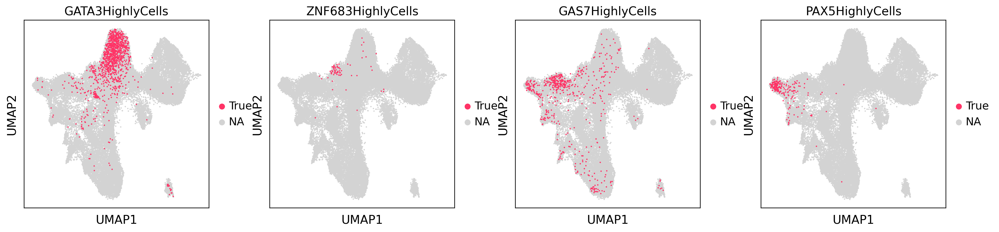

In [55]:
gene_color=[x+'HighlyCells' for x in ['GATA3','ZNF683','GAS7','PAX5']]

sc.pl.umap(adata,color=gene_color,groups=['True'],size=10,
           #alpha_img=0.5,
           save='_adata_GATA3_ZNF683_GAS7_PAX5_HighlyCells_D11_20220108.pdf'
          )

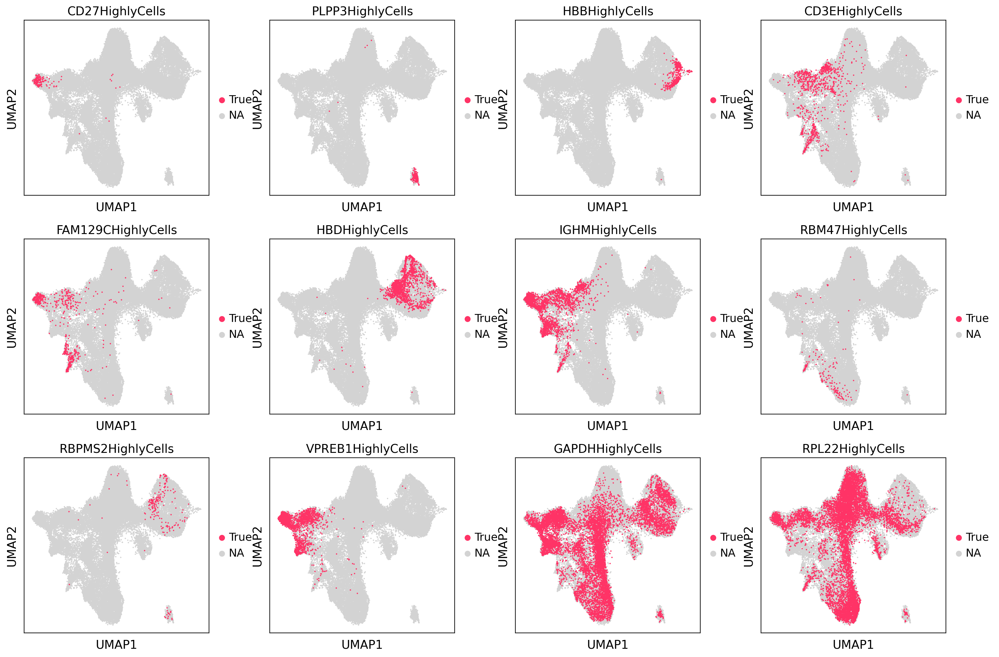

In [28]:
gene_color=[x+'HighlyCells' for x in ['CD27','PLPP3','HBB','CD3E','FAM129C','HBD','IGHM','RBM47','RBPMS2','VPREB1',
                        'GAPDH','RPL22']]

sc.pl.umap(adata,color=gene_color,groups=['True'],size=10,
           #alpha_img=0.5,
           save='_adata_Genes_HighlyCells_D11_20220108.pdf'
          )

In [11]:
num_allCells = len(adata.obs_names)
# struct the cell type sets for enrichment analysis
print('struct the cell type sets for enrichment analysis...')
adata_cell_type_df = pd.DataFrame(adata.obs['cell_type_id']);
cell_type_index = pd.Categorical(adata.obs['cell_type_id']).categories;
cell_sets = dict();
for ct in cell_type_index:
    cell_sets[ct] = list(adata_cell_type_df.loc[adata_cell_type_df['cell_type_id'] ==ct,:].index);
all_gene_Fisher_r = pd.DataFrame(index=cell_type_index)
for g in ['CD27','CDH5','HBB','CD3E','FAM129C','HBD','IGHM','RBM47','RBPMS2','VPREB1',
                        'GAPDH','RPL22','GATA2']:
    gene_ratio, gene_pv, gene_qv, gene_score, gene_means = plogs.Fisher_test_for_each_gene(rdata_df=rdata_df,
                                cell_sets=cell_sets,
                                num_allCells=num_allCells,
                               gene=g,
                               power=8)
    Fisher_r = pd.DataFrame(index=cell_type_index,columns=[g+x for x in ['_ratio', '_pValue', '_qValue', '_score']])
    Fisher_r.iloc[:,0] = gene_ratio[g]
    Fisher_r.iloc[:,1] = gene_pv[g]
    Fisher_r.iloc[:,2] = gene_qv[g]
    Fisher_r.iloc[:,3] = gene_score[g]
    all_gene_Fisher_r = all_gene_Fisher_r.join(Fisher_r)

struct the cell type sets for enrichment analysis...


In [13]:
all_gene_Fisher_r.to_csv('./write/adata_Genes_HighlyCells_Fisher_r_D11_20220108.csv')

In [12]:
all_gene_Fisher_r

,CD27_ratio,CD27_pValue,CD27_qValue,CD27_score,CDH5_ratio,CDH5_pValue,CDH5_qValue,CDH5_score,HBB_ratio,HBB_pValue,...,GAPDH_qValue,GAPDH_score,RPL22_ratio,RPL22_pValue,RPL22_qValue,RPL22_score,GATA2_ratio,GATA2_pValue,GATA2_qValue,GATA2_score
B,0.936620,1.000000e-300,2.200000e-299,2.030814e+01,0.000000,1.000000e+00,1.000000e+00,0.000000e+00,0.022414,9.999969e-01,...,1.994202e-63,6.240420e-01,0.049020,5.639449e-07,1.973807e-06,3.851045e-02,0.005365,1.000000e+00,1.000000e+00,-0.000000e+00
cycl-B,0.011737,9.994891e-01,1.000000e+00,2.484165e-07,0.000000,1.000000e+00,1.000000e+00,0.000000e+00,0.000000,1.000000e+00,...,1.150000e-299,5.206071e+00,0.007684,1.000000e+00,1.000000e+00,6.350347e-14,0.001894,1.000000e+00,1.000000e+00,7.013583e-15
EarlyLymp,0.014085,1.000000e+00,1.000000e+00,6.875670e-12,0.000000,1.000000e+00,1.000000e+00,0.000000e+00,0.002586,1.000000e+00,...,1.590763e-139,1.531552e+00,0.055821,8.594194e-01,1.000000e+00,3.234540e-04,0.002840,1.000000e+00,1.000000e+00,2.528307e-15
EarlyMyel,0.002347,1.000000e+00,1.000000e+00,4.145477e-15,0.000000,1.000000e+00,1.000000e+00,0.000000e+00,0.000000,1.000000e+00,...,1.150000e-299,4.586349e+00,0.096008,1.222737e-64,6.419371e-64,5.303362e-01,0.008837,1.000000e+00,1.000000e+00,-0.000000e+00
Endo,0.000000,1.000000e+00,1.000000e+00,0.000000e+00,0.986207,2.198722e-263,4.617315e-262,7.364003e+01,0.003448,9.999649e-01,...,1.000000e+00,1.791970e-13,0.004328,1.000000e+00,1.000000e+00,-0.000000e+00,0.004103,1.000000e+00,1.000000e+00,-0.000000e+00
E/B/M,0.000000,1.000000e+00,1.000000e+00,-0.000000e+00,0.000000,1.000000e+00,1.000000e+00,0.000000e+00,0.000862,1.000000e+00,...,1.000000e+00,-0.000000e+00,0.019255,9.100020e-01,1.000000e+00,1.918476e-04,0.118668,1.000000e-300,8.000000e-300,5.102596e+00
Ery,0.002347,1.000000e+00,1.000000e+00,2.489356e-15,0.000000,1.000000e+00,1.000000e+00,0.000000e+00,0.569828,1.000000e-300,...,1.000000e+00,5.531548e-05,0.045663,1.000000e+00,1.000000e+00,1.264480e-13,0.188102,2.997617e-228,1.573749e-227,1.918178e+00
cycl-Ery,0.000000,1.000000e+00,1.000000e+00,0.000000e+00,0.000000,1.000000e+00,1.000000e+00,0.000000e+00,0.258621,1.936950e-145,...,9.886125e-42,3.796329e-01,0.005653,1.000000e+00,1.000000e+00,3.398648e-14,0.150229,1.000000e-300,8.000000e-300,3.646793e+00
HSC/MPP,0.002347,1.000000e+00,1.000000e+00,2.455815e-15,0.006897,1.000000e+00,1.000000e+00,7.799922e-16,0.002586,1.000000e+00,...,1.000000e+00,8.497770e-14,0.223459,5.635727e-123,5.917513e-122,9.659616e-01,0.074483,1.000000e+00,1.000000e+00,1.053309e-14
Late-Ery,0.000000,1.000000e+00,1.000000e+00,-0.000000e+00,0.006897,1.846911e-01,1.000000e+00,1.519877e-02,0.053448,5.156308e-89,...,1.000000e+00,1.545373e-07,0.000442,9.984446e-01,1.000000e+00,1.282168e-06,0.000473,9.897005e-01,1.000000e+00,5.386034e-06


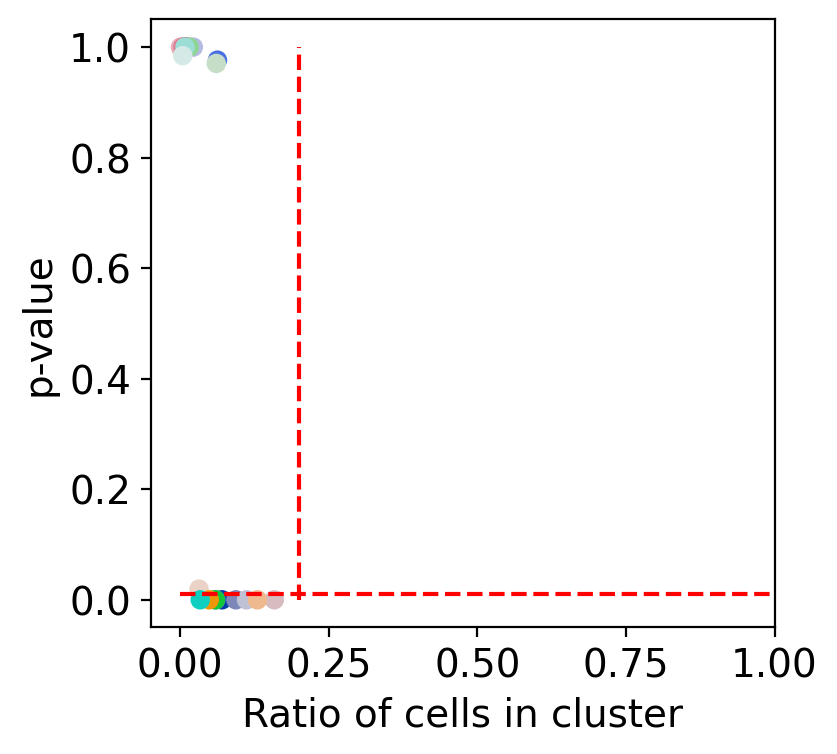

In [18]:
plt.scatter(x=all_gene_Fisher_r['GAPDH_ratio'],
                       y=all_gene_Fisher_r['GAPDH_pValue'],
                        marker='o',
                        #s=list(adata_pseu_location_draw_graph['ratio']*100),#cmap=mycmap3,
                        #linewidths=0.5,alpha=0.5,
                        #edgecolors='black',
                        #cmap='rainbow',
                         #c='black',
                        c=adata.uns['cell_type_id_colors']
                      )
plt.hlines(y=0.01,xmin=0,xmax=1,colors='red',linestyles='dashed');
plt.vlines(x=0.2,ymin=0,ymax=1,colors='red',linestyles='dashed')
plt.xlim(right=1);
plt.xlabel(xlabel='Ratio of cells in cluster');
plt.ylabel(ylabel='p-value');
plt.grid(b='')
#plt.show()
plt.savefig('./figures/scatterplot_GAPDH_Fisher_r_ratio_pValue_d11_20220108.pdf',dpi=500)
#plt.close()

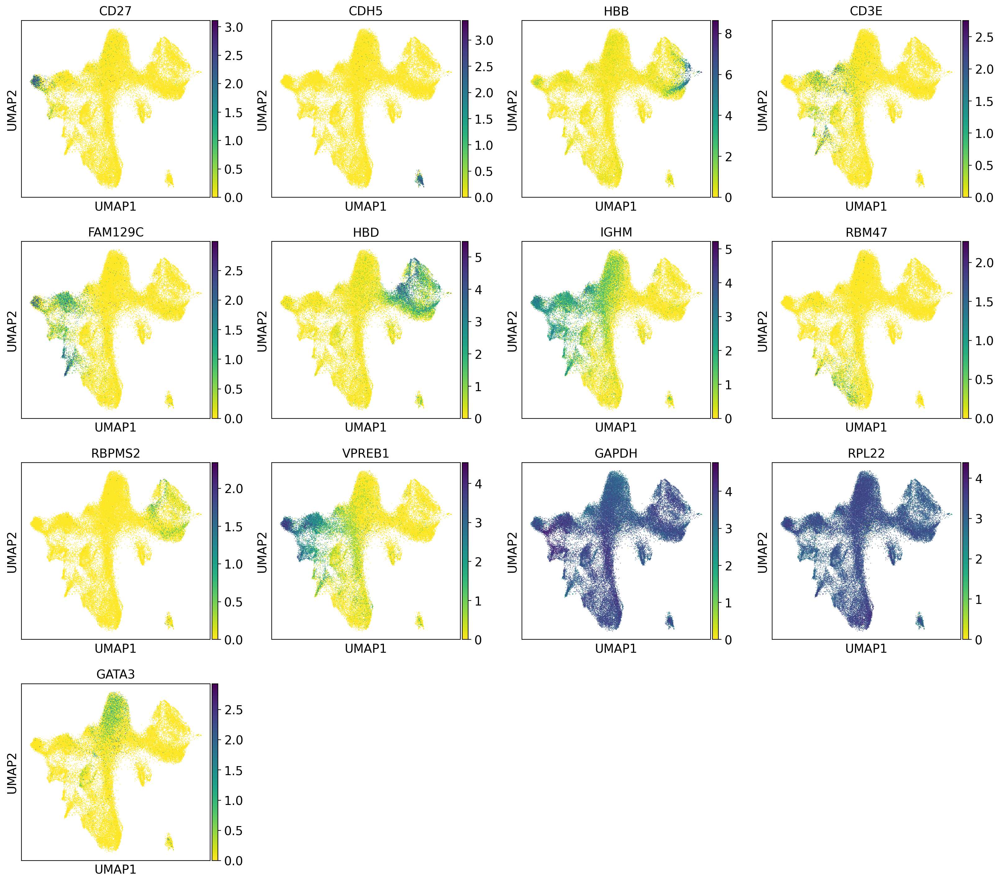

In [372]:
sc.pl.umap(adata,color=['CD27','CDH5','HBB','CD3E','FAM129C','HBD','IGHM','RBM47','RBPMS2','VPREB1',
                        'GAPDH','RPL22','GATA3'],
           alpha_img=0.5,cmap='viridis_r',
           #save='_adata_Genes_HighlyCells_expr_20211110.pdf'
          )

# identifying DEGs by deaplog

In [65]:
#import deaplog as dpg
markers_m = dpg.deaplog.get_DEG_multi(rdata=adata,adata=adata,group_key='cell_type_id',
                               power=11)
adata.uns['markers_m_DEAPLOG'] = markers_m

In [54]:
markers_m.to_csv('./write/adata_markers_m_by_DEAPLOG_D11_20220108.csv')

In [193]:
markers_m

,cell_type,gene_name,ratio,p_value,q_value,score,mean_exValue
0,B,HEY2,0.258065,8.284396e-05,1.739723e-03,0.042540,1.117460
1,B,MACROD2,0.868132,4.917728e-91,1.032723e-89,5.148695,1.817160
2,B,AC005070.3,0.267606,2.299519e-18,2.414495e-17,0.313026,1.834999
3,B,USP41,0.666667,7.426833e-05,1.559635e-03,0.156879,1.576885
4,B,SMAD1,0.221440,6.685669e-229,1.403991e-227,1.881962,1.030615
...,...,...,...,...,...,...,...
11576,cycl-PreDC,AZIN2,0.272727,5.293165e-09,1.111565e-07,0.758747,1.270646
11577,cycl-PreDC,IGLC3,0.234375,1.652727e-19,1.735363e-18,3.260658,2.799939
11578,cycl-PreDC,SCT,0.203571,1.955105e-67,2.052860e-66,7.746832,2.156333
11579,cycl-PreDC,MYBPH,0.413793,2.563658e-19,5.383682e-18,2.893731,1.421872


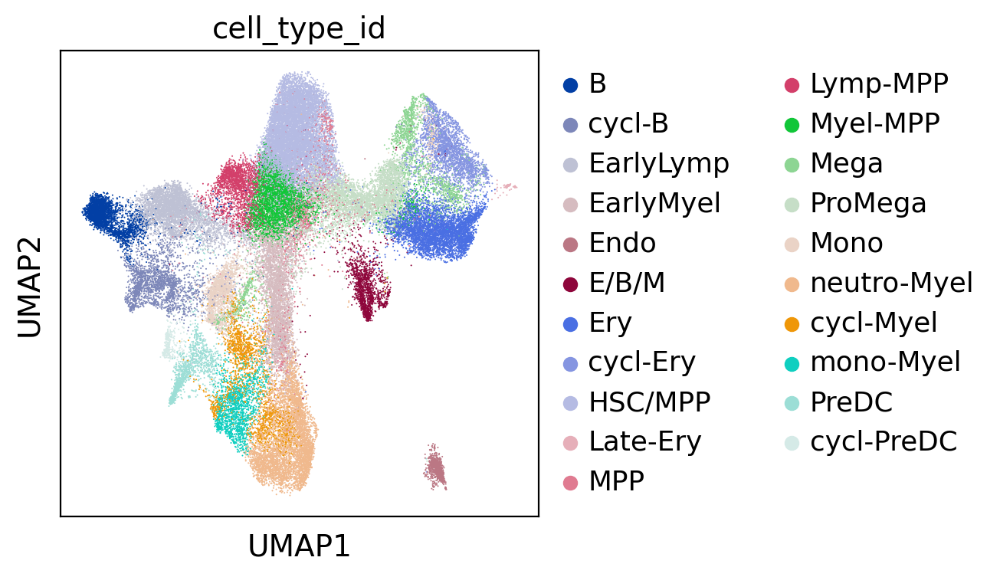

In [423]:
sc.pl.umap(adata,color=['cell_type_id'],cmap='viridis_r',save='adata_cell_type_id_20230630.pdf')

In [97]:
marker_genes = []
for ct in adata.obs['cell_type_id'].cat.categories:
    marker_genes = marker_genes+list(markers_m_f.loc[markers_m_f['cell_type']==ct,
                                                    ].loc[markers_m_f['ratio']>0.5,
                                                         ].sort_values(by='score',ascending=False).head(50)['gene_name'])

In [98]:
adata_markers_df = adata[:,adata.var_names.isin(pd.unique(marker_genes))]
adata_markers_df = adata_markers_df.to_df()
adata_markers_df = adata_markers_df.reindex(columns=list(pd.unique(marker_genes)))
adata_markers_df['cell_type_id'] = adata.obs['cell_type_id']
adata_markers_df = adata_markers_df.sort_values(by='cell_type_id')

In [99]:
adata_markers_df = adata_markers_df.reindex(columns=list(pd.unique(marker_genes)))
adata_markers_df['cell_type_id'] = adata.obs['cell_type_id']
adata_markers_df = adata_markers_df.sort_values(by='cell_type_id')
cluster_names=adata_markers_df.pop('cell_type_id')
louvain_tag = adata.obs['cell_type_id'].cat.categories
louvain_lut1=dict(zip(louvain_tag,adata.uns['cell_type_id_colors']))
louvain_col_colors=cluster_names.map(louvain_lut1)

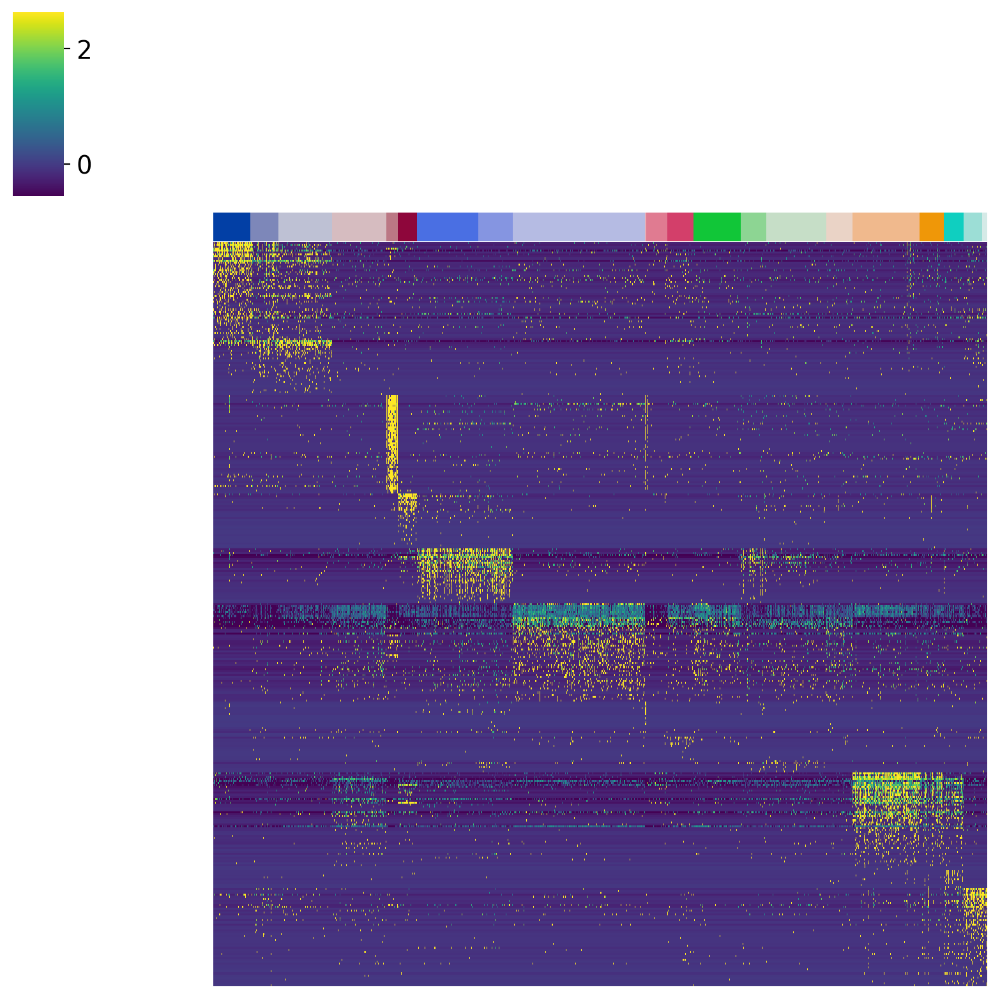

In [101]:
cg_degs=sns.clustermap(adata_markers_df.transpose(),
                           metric="correlation",
                           cmap='viridis',
                        row_cluster=False,
                       col_cluster=False,
                       robust=True,xticklabels=False,figsize=(8,8),
                            yticklabels= False,
               z_score=0,
               #standard_scale=0,
               col_colors=[louvain_col_colors]
              )

In [130]:
cg_degs.savefig('./figures/haematopoiesis_DEGs_heatmap_20210629.tiff',dpi=500)

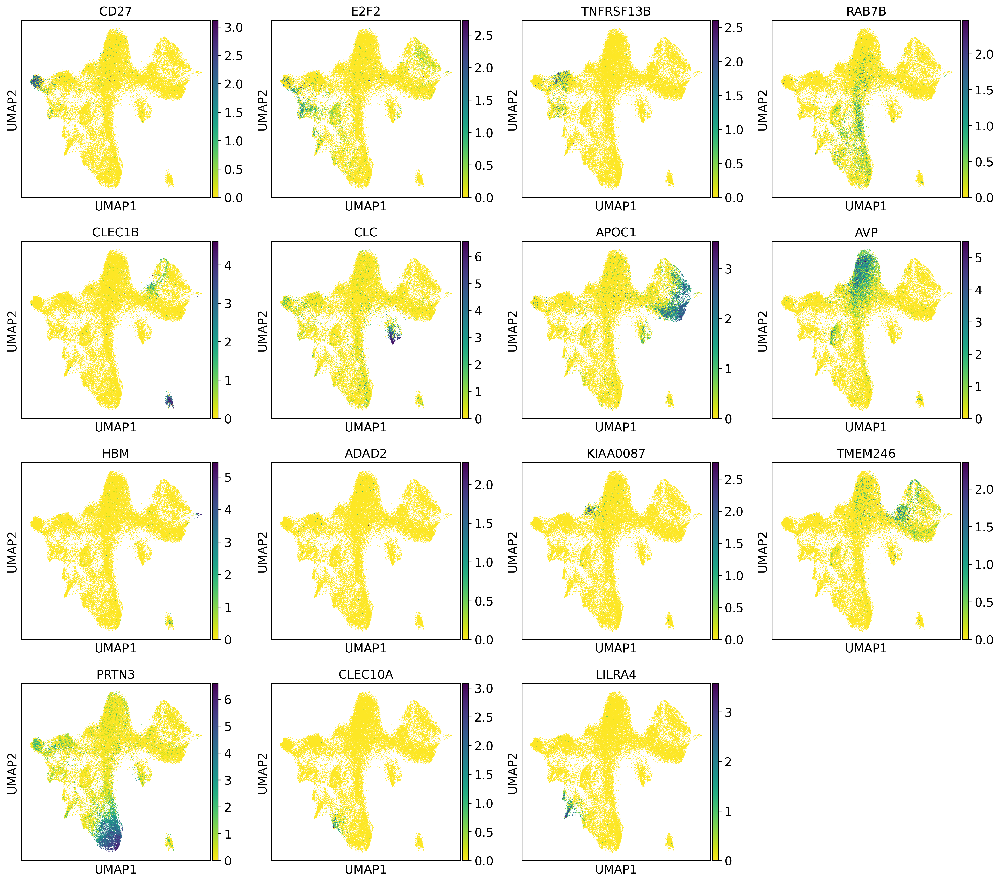

In [144]:
sc.pl.umap(adata,color=['CD27','E2F2','TNFRSF13B','RAB7B','CLEC1B','CLC',
                       'APOC1','AVP','HBM','ADAD2','KIAA0087',
                       'TMEM246','PRTN3','CLEC10A','LILRA4'],cmap='viridis_r',
          save='adata_ct_markers_20210918.pdf')